<a href="https://colab.research.google.com/github/Mathildec25/Dataset-Code/blob/master/2_optimisation_bayesienne.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install GpyOpt
pip install GPy

SyntaxError: ignored

# Méthodes d'optimisation pour la chimie - Cours ECPM
# Partie 2 : L'optimisation bayésienne, théorie et pratique

Dr. Thomas Galeandro-Diamant

thomas@chemintelligence.com

ChemIntelligence

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import GPy
import GPyOpt
import random
from IPython.display import Image

ModuleNotFoundError: ignored

# Optimisation bayésienne

L'optimisation bayésienne est une méthode d'optimisation probabiliste, qui est en général basée sur des processus Gaussiens, eux-même basés sur les distributions Gaussiennes.

Nous allons aujourd'hui surtout travailler sur des problèmes d'optimisation dans des espace de dimension 1 ou 2 (pour pouvoir les visualiser), mais cela peut être généralisé à des espaces de dimension $n$.

## Pourquoi l'optimisation bayésienne est particulièrement adaptée à la chimie ?

- Les expériences sont coûteuses et longues, donc on ne peut pas faire beaucoup d'itérations. -> l'optimisation bayésienne est économe en expériences.
- On ne connaît pas la forme mathématique de la fonction objectif $f$, en général. -> l'optimisation bayésienne ne nécessite pas de connaître $f$.
- On a parfois des variables d'entrée catégorielles. -> l'optimisation bayésienne peut les traiter, même si la plupart des bibliothèques ne le font pas bien (mauvaises performances avec des variables catégorielles).
- On dispose parfois de données avant de démarrer l'optimisation (expériences déjà réalisées). -> l'optimisation bayésienne les prend en compte.


## Algorithme de l'optimisation Bayésienne

0. Définir un/des objectif(s) et une/des contrainte(s).
1. Construire un modèle de ML (processus gaussien, en général) avec les données disponibles (s'il y en a).
2. Appliquer une fonction d'acquisition au modèle
3. Chercher le maximum de la fonction d'acquisition (ce qui est un problème d'optimisation...)
4. Ce maximum est la prochaine expérience à réaliser. La réaliser au laboratoire.
5. Intégrer la nouvelle expérience au jeu de données.
6. Si on a atteint les objectifs, s'arrêter. Sinon, retourner au point 1.

In [ ]:
Image("figures/bo.drawio.png")

## Processus Gaussiens

Les processus Gaussiens vont nous permettre de modéliser la fonction objectif $f$ et de quantifier l'incertitude de ce modèle.

In [ ]:
# Notre fonction objectif
def f(x):
    return np.multiply((0.5*x - 2.), np.sin(x - 0.5))

On commence par définir une distribution de fonctions *a priori*, basée sur un *kernel* (une fonction de covariance).

Dans ce cours, nous travaillerons avec le noyau (kernel) RBF (*Radial Basis Function*), défini comme ceci : $K(\boldsymbol{x}, \boldsymbol{x'}) = \exp\Big(-\frac{\Vert \boldsymbol{x} - \boldsymbol{x'}\Vert^2}{2\sigma^2}\Big)$, avec $\boldsymbol{x}$ et $\boldsymbol{x'}$ deux points de notre espace à $n$ dimensions.

Nous ne rentrerons pas dans les détails des kernels dans ce cours, mais sachez qu'il en existe plusieurs. Le kernel RBF est relativement générique, et il existe des kernels plus spécifiques, que l'on peut par exemple utiliser pour des données qui comportent une périodicité.

Le kernel RBF nous permet de définir une *distribution de fonctions*, que nous appellerons *distribution a priori*.

Dans le graphe ci-dessous, nous représentons une de ces distributions, dont la moyenne est de $0$. Vingt fonctions échantillonnées à partir de cette distribution sont tracées par les différentes courbes colorées (on peut bien entendu en échantillonner autant que l'on veut). La zone colorée en bleu ciel représente un intervalle de confiance de $2*\sigma$ autour de la moyenne de $0$, dans lequel la masse de probabilité de la distribution *a priori* est de $0.95$.

**Kernel RBF (Radial Basis Function)**

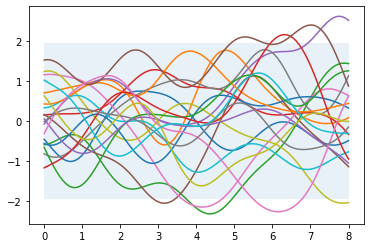

In [ ]:
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 20)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
for i in range(20):
    plt.plot(X[:],Z[i,:])

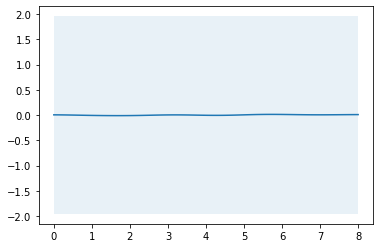

In [ ]:
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 10000)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
plt.plot(X[:],np.mean(Z, axis=0))

plt.show()

In [ ]:
plt.plot(X[:],Z[:,5])

AttributeError: ignored

**Kernel Matérn 5/2**

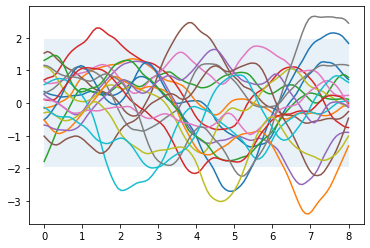

In [ ]:
kernel = GPy.kern.Matern52(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 20)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
for i in range(20):
    plt.plot(X[:],Z[i,:])

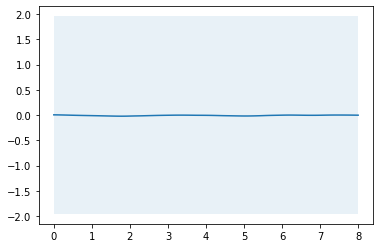

In [ ]:
kernel = GPy.kern.Matern52(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 10000)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
plt.plot(X[:],np.mean(Z, axis=0))

**Kernel Matérn 3/2**

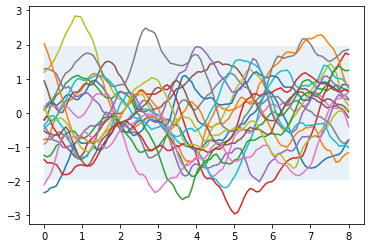

In [ ]:
kernel = GPy.kern.Matern32(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 20)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
for i in range(20):
    plt.plot(X[:],Z[i,:])

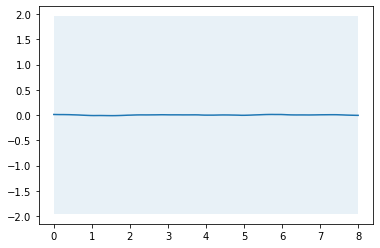

In [ ]:
kernel = GPy.kern.Matern32(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 10000)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
plt.plot(X[:],np.mean(Z, axis=0))

**Kernel Standard Periodic**

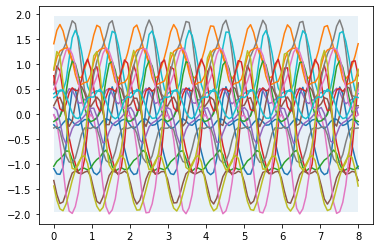

In [ ]:
kernel = GPy.kern.StdPeriodic(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 20)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
for i in range(20):
    plt.plot(X[:],Z[i,:])

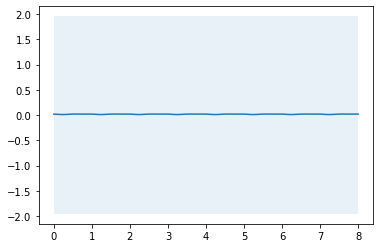

In [ ]:
kernel = GPy.kern.StdPeriodic(input_dim=1, variance=1., lengthscale=1.)
X = np.linspace(0, 8, 100)
X = X[:,None]
mu = np.zeros((100))
cov = kernel.K(X, X)
Z = np.random.multivariate_normal(mu, cov, 10000)
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.fill_between(np.linspace(0, 8, 100), mu + uncertainty, mu - uncertainty, alpha=0.1)
plt.plot(X[:],np.mean(Z, axis=0))


*Que notez-vous sur ces distributions de fonctions *a priori*?* ___

RBF : lisse;
3/2 : chaotique;
Periodic : périodique

Les distributions de fonctions *a priori* dont nous disposons sont notre point de départ. Nous allons maintenant intégrer les expériences que nous avons réalisées afin d'obtenir des distributions de fonctions *a postériori* grâce au théorème de Bayes : $P(A \vert B) = \frac{P(B \vert A) P(A)}{P(B)}$.

Sans rentrer dans les détails, retenez que nous "mettons à jour" notre distribution *a priori* grâce aux données dont nous disposons, et que nous obtenons ainsi une distribution *a posteriori*.

Dans les graphes ci-après, nous représentons un processus gaussien construit grâce à cinq points échantillonnés sur notre fonction objectif $f$. Vous pouvez constater que la distribution de fonctions a changé par rapport à la distribution *a priori* que nous avons représentée plus haut (voir Kernel RBF). En effet, les cinq points que nous avons "introduit" dans le processus gaussien ont modifié sa distribution.

On remarque que l'incertitude du modèle (représentée par la zone en bleu ciel) est plus faible autour des cinq points, et qu'elle augmente au fur et à mesure qu'on s'éloigne de ces cinq points.

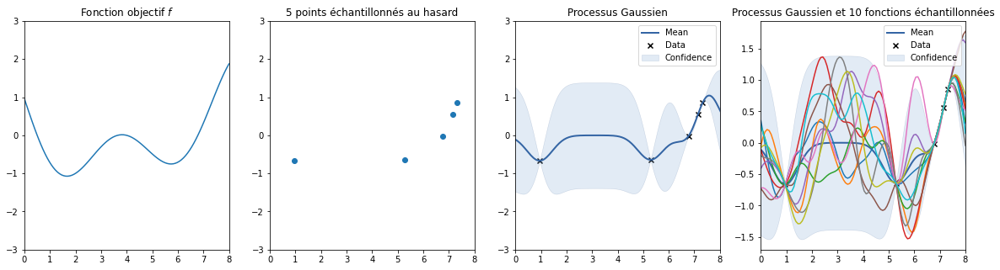

In [ ]:

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,5))
ax1.set_xlim([0, 8])
ax1.set_ylim([-3, 3])
ax2.set_xlim([0, 8])
ax2.set_ylim([-3, 3])
ax3.set_xlim([0, 8])
ax3.set_ylim([-3, 3])
x1 = np.linspace(0, 8, 100).reshape(-1, 1)
ax1.set_title("Fonction objectif $f$")
ax1.plot(x1, f(x1))
# Prendre 5 points au hasard entre 0 et 8
x2 = np.array([[random.uniform(0, 8)] for _ in range(5)])
y2 = f(x2)
ax2.set_title("5 points échantillonnés au hasard")
ax2.plot(x2, y2, marker = 'o', color = 'C0', linestyle="None")

# Ajuster un processus Gaussien aux 5 points
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=1.)
m = GPy.models.GPRegression(x2,y2,kernel)
m.Gaussian_noise[:] = 1e-9
m.Gaussian_noise.fix()
m.rbf.variance[:] = .5
m.rbf.variance.fix()
m.rbf.lengthscale[:] = .5
m.rbf.lengthscale.fix()
ax3.set_title("Processus Gaussien")
_ = m.plot(ax = ax3, plot_density=False, xlim = (0,8))
#posterior_sample = m.posterior_samples_f(x1, full_cov=True, size=1)
#_ = [ax3.plot(x1, posterior_sample[:, :, i]) for i in range(1)]

ax4.set_title("Processus Gaussien et 10 fonctions échantillonnées")
_ = m.plot(ax = ax4, plot_density=False, xlim = (0,8))
posterior_sample = m.posterior_samples_f(x1, full_cov=True, size=10)
_ = [ax4.plot(x1, posterior_sample[:, :, i]) for i in range(10)]

En général, les modèles de processus Gaussiens sont construits à partir de données centrées sur 0 (ce qui est à peu près le cas ici). Si vos données ne sont pas du tout centrées autour de 0, il est judicieux de les re-centrer autour de 0.

En résumé, le processus Gaussien dont nous disposons maintenant est un modèle de régression qui contient une mesure d'incertitude. Nous allons donc maintenant pouvoir démarrer un processus d'optimisation grâce à ce modèle.

Pour plus d'informations sur les processus Gaussiens : https://scikit-learn.org/stable/modules/gaussian_process.html

# L'optimisation bayésienne

Pour démarrer notre processus d'optimisation bayésienne, nous avons besoin :
1. D'un processus Gaussien, qui modélise les données dont on dispose déjà, et fournit une incertitude sur ce modèle,
2. D'une *fonction d'acquisition*, qui détermine à partir du procédé Gaussien à quel endroit de l'espace des paramètres il est le plus judicieux de réaliser la prochaine expérience.

## Les fonctions d'acquisition

Trois fonctions d'acquisition sont présentées ci-après. Il en existe d'autres.

**Probability of Improvement (PI)**

On définit $I$ l'amélioration (improvement) de $f$ en $x$ produisant $f(x) = y$ comme étant $$I(y) = \max(y_{min} - y, 0)$$

$I$ définit l'amélioration possible en $x$ par rapport à $y_{min}$, la plus faible valeur de $f$ présente dans les données.

La probabilité d'amélioration (PI) au point $x$ est définie comme étant : $$\mathrm{PI}(y < y_{min}) = \int_{-\infty}^{y_{min}}\mathcal{N}(y\vert \mu(x), \sigma(x))$$

Elle représente la probabilité qu'évaluer la fonction $f$ en $x$ produise un résultat $y$ qui soit inférieur au résultat minimal actuel $y_{min}$.

![image.png](attachment:image.png)

**Expected improvement (EI)**

L'inconvénient de la fonction d'acquisition PI est qu'elle a tendance à améliorer la valeur de $y_{min}$ assez peu à chaque itération.

La fonction **Expected Improvement** prend à la fois en compte la probabilité de trouver un meilleur résultat et à quel point ce résultat est meilleur.

$$\mathrm{EI}(x) = (y_{min} - y)\mathrm{PI}(y < y_{min}) + \sigma\mathcal{N}(y_{min}\vert\mu(x), \sigma(x))$$ avec $y$ la valeur moyenne du processus Gaussien en $x$.

**Lower confidence bound (LCB)**

$\mathrm{LCB}(x) = \mu(x) - \alpha\sigma(x)$, avec $\alpha$ un nombre positif permettant de contrôler l'équilibre entre exploration et exploitation (nous aborderons ce concept plus tard).

**Comparaison graphique des fonctions d'acquisition**

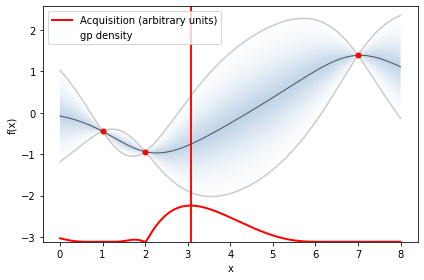

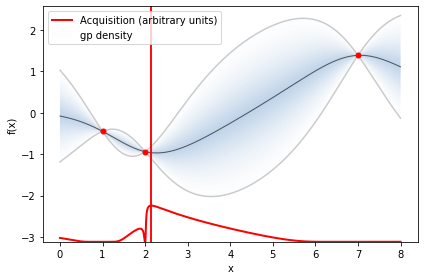

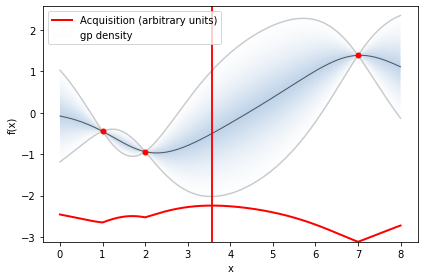

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
X = np.array([[1], [2], [7]])
Y = f(X)
# Expected Improvement
bo = GPyOpt.methods.BayesianOptimization(f, bounds, X = X, Y = Y, acquisition_type='EI', initial_design_numdata = 2)
bo.plot_acquisition()
# Maximum Probability of Improvement
bo = GPyOpt.methods.BayesianOptimization(f, bounds, X = X, Y = Y, acquisition_type='MPI', initial_design_numdata = 2)
bo.plot_acquisition()
# Lower Confidence Bound
bo = GPyOpt.methods.BayesianOptimization(f, bounds, X = X, Y = Y, acquisition_type='LCB', initial_design_numdata = 2)
bo.plot_acquisition()

*Quels commentaires pouvez-vous faire ?*

# Exercices

Nous allons utiliser une bibliothèque open source d'optimisation bayésienne : GPyOpt

## Optimisation bayésienne en 1 dimension : pratique

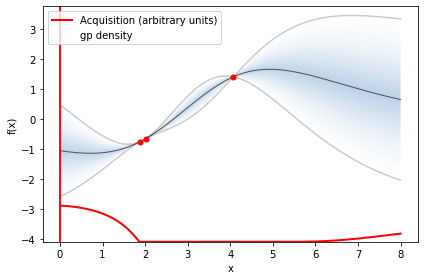

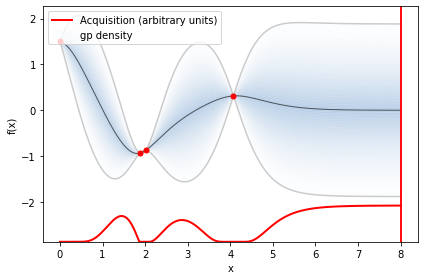

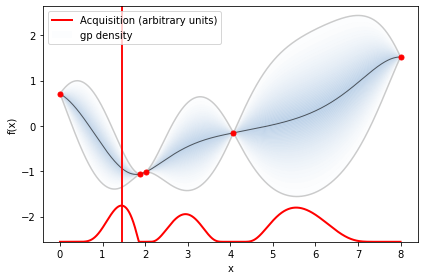

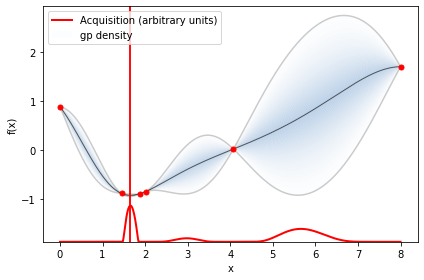

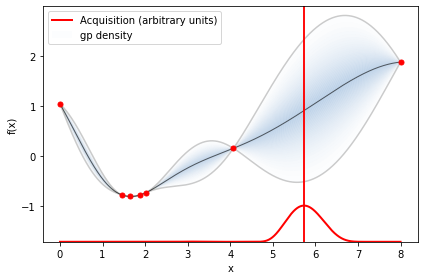

...

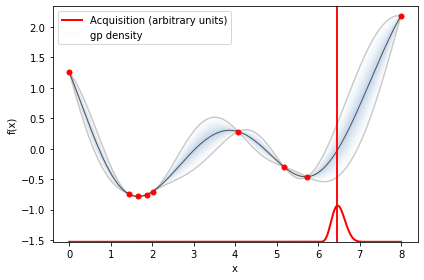

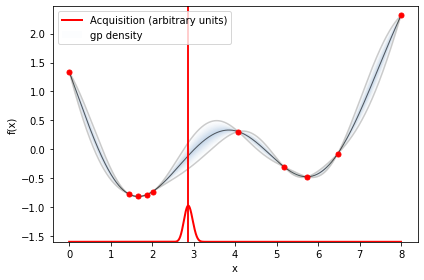

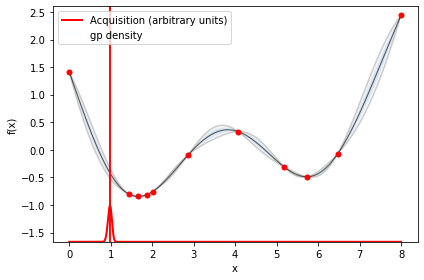

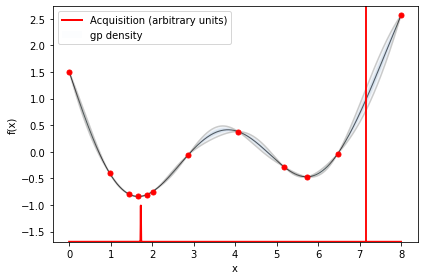

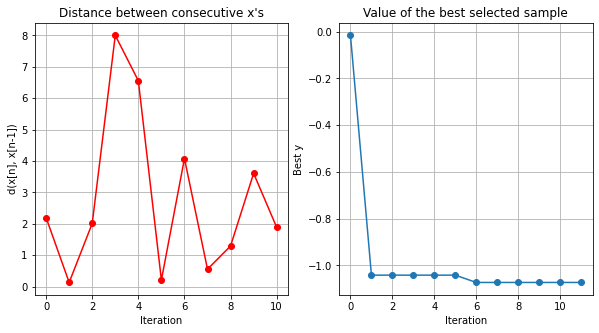

In [ ]:
# Exercice : optimiser la fonction objectif f entre 0 et 8, avec 2 points initiaux
# et sur 10 itérations d'optimisation
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
bo = GPyOpt.methods.BayesianOptimization(f, bounds, acquisition_type='EI', initial_design_numdata = 2)

for _ in range(10):
    bo.run_optimization(1)
    bo.plot_acquisition()

bo.plot_convergence()

*Quels commentaires pouvez-vous faire ?*


## Optimisation bayésienne en 2 dimensions : pratique

In [ ]:
# Fonction objectif en 2 dimensions
def a(x):
    b = (5.1/(4.*np.pi**2))
    c = (5./np.pi)
    t = (1./(8.*np.pi))
    return ((x[:, 1]-b*x[:, 0]**2+c*x[:, 0]-6.)**2 + 10.*(1-t)*np.cos(x[:, 0]) + 10.).reshape(-1, 1)

Minimal value found: 0.39791543883043445 at x =  [3.14318246 2.26976719]


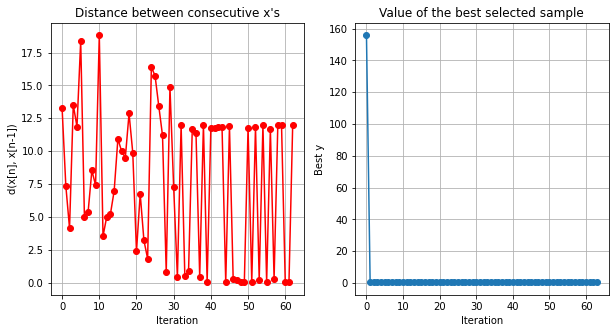

In [ ]:
# Exercice : optimiser la fonction objectif a avec x1 compris entre -5 et 10 et x2 entre 0 et 15
# avec 4 points initiaux et 20 itérations d'optimisation.
# Ensuite, afficher le minimum trouvé en utilisant la fonction np.min, et le x correspondant
# à ce minimum (en utilisant la fonction np.argmin)
# (les variables X et Y contiennent les expériences réalisées durant l'optimisation)



bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (-5,10)},
          {'name': 'var_2', 'type': 'continuous', 'domain': (0,15)}]
bo = GPyOpt.methods.BayesianOptimization(a, bounds, acquisition_type='LCB', initial_design_numdata = 4)

for _ in range(20):
    bo.run_optimization(3)
    #bo.plot_acquisition()
X, Y = bo.get_evaluations()

print("Minimal value found:", np.min(Y), "at x = ", X[np.argmin(Y)])
bo.plot_convergence()

*Quels commentaires pouvez-vous faire ?*


## Exploration et exploitation : théorie

L'exploration et l'exploitation sont deux stratégies d'optimisation.

L'*exploitation* est une recherche de solution uniquement basée sur la valeur prédite par le processus gaussien ($\mu (x)$)

L'*exploration* est une recherche dans des zones de l'espace des paramètres où l'incertitude du modèle est plus élevée.

L'exploration permet de ne pas se trouver bloqué dans un minimum local.

Souvent, il n'y a pas de frontière claire entre exploitation et exploration ; chaque point proposé par l'algorithme d'optimisation est plus ou moins exploratoire.

En fonction des fonctions d'acquisition, il est plus ou moins aisé de faire de l'exploration. Souvenez-vous de la fonction d'acquisition *Lower Confidence Bound* définie par $\mathrm{LCB}(x) = \mu(x) - \alpha\sigma(x)$. Dans cette formule, la constante $\alpha$ est spécifiquement dédiée au réglage de l'équilibre entre exploration et exploitation : plus $\alpha$ est élevée, plus l'exploration sera prépondérente.

## Exploration et exploitation : visualisation en 1D

Visualisons en 1D l'effet du ratio exploration/exploitation avec la fonction d'acquisition LCB.

Exploration weight: 0.02
Suggested x: [[2.22375898]]


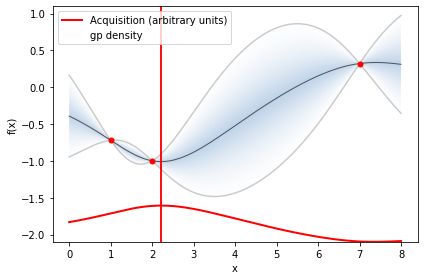

Exploration weight: 1.0
Suggested x: [[2.92680648]]


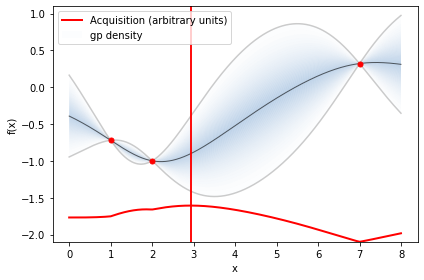

Exploration weight: 200
Suggested x: [[4.61165538]]


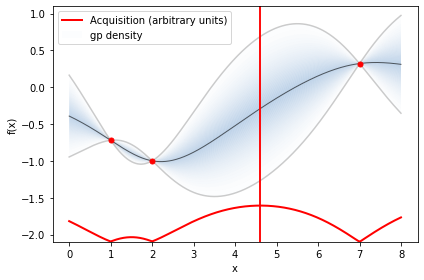

In [ ]:
# Fonction d'acquisition : Lower Confidence Bound
for exploration_weight in [0.02, 1., 200]:
    bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
    X = np.array([[1], [2], [7]])
    Y = f(X)
    objective = GPyOpt.core.task.SingleObjective(func = None)
    model = GPyOpt.models.GPModel(exact_feval=True,optimize_restarts=10,verbose=False)
    feasible_region = GPyOpt.Design_space(space = bounds, constraints = [])
    aquisition_optimizer = GPyOpt.optimization.AcquisitionOptimizer(feasible_region)
    acquisition = GPyOpt.acquisitions.LCB.AcquisitionLCB(model, feasible_region, optimizer = aquisition_optimizer, exploration_weight = exploration_weight)
    evaluator = GPyOpt.core.evaluators.Sequential(acquisition)
    initial_design = GPyOpt.experiment_design.initial_design('random', feasible_region, 4)
    bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,X_init = X, Y_init = Y, normalize_Y = False)
    x_next = bo.suggest_next_locations()
    print("Exploration weight:", exploration_weight)
    print("Suggested x:", x_next)
    bo.plot_acquisition()


*Quels commentaires pouvez-vous faire ?*

En générale, on choisit α entre 1 et 10

## Exploration et exploitation : pratique en 2D

Réalisons 20 itérations d'optimisation sur la fonction $c(\boldsymbol{x})$ (en 2 dimensions), avec différents ratios exploration/exploitation.

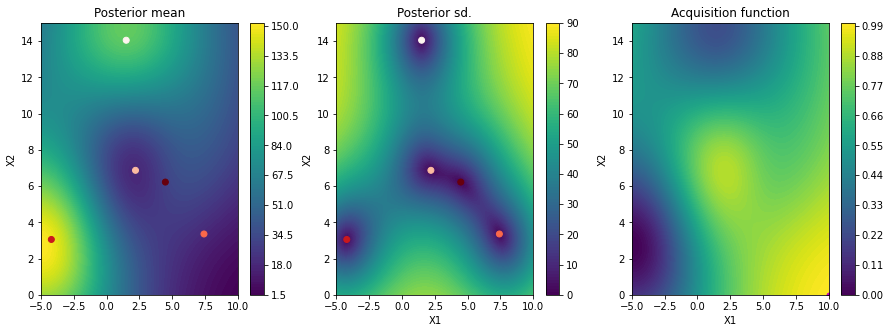

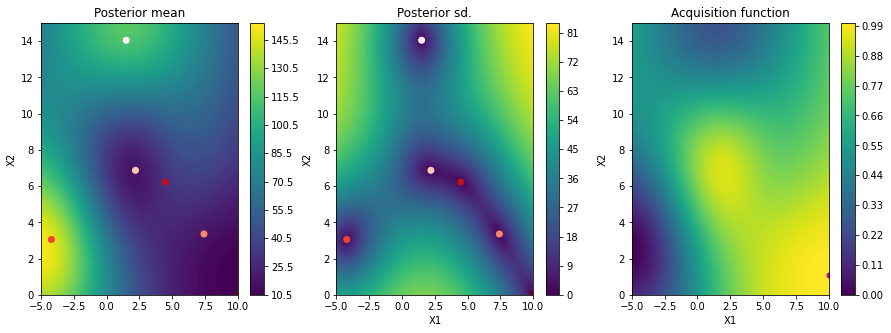

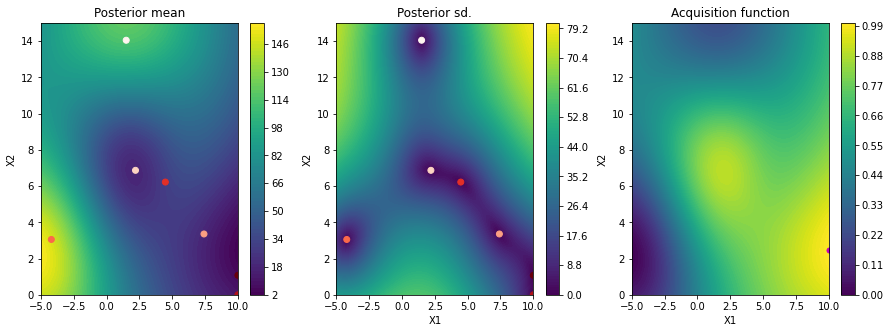

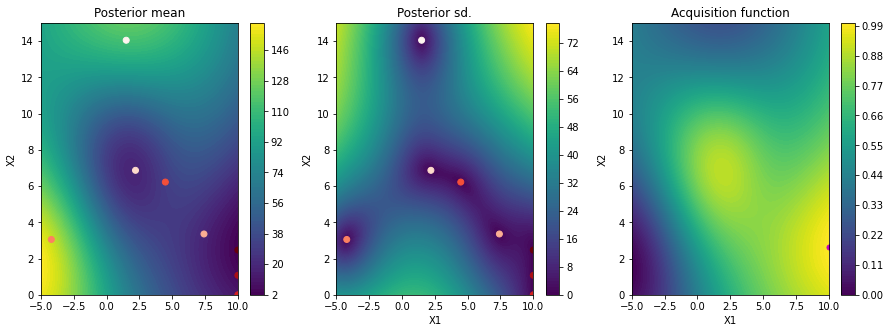

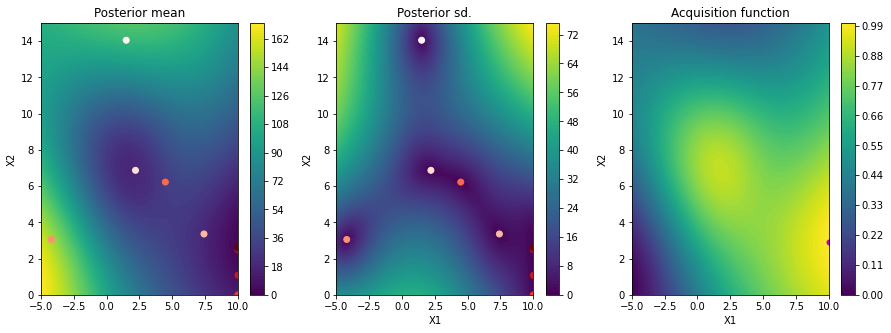

...

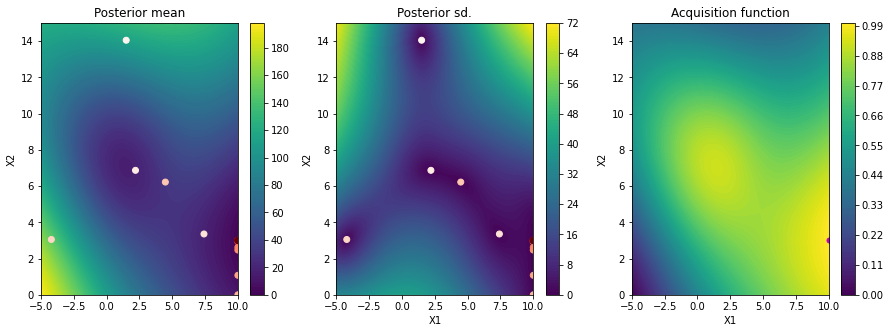

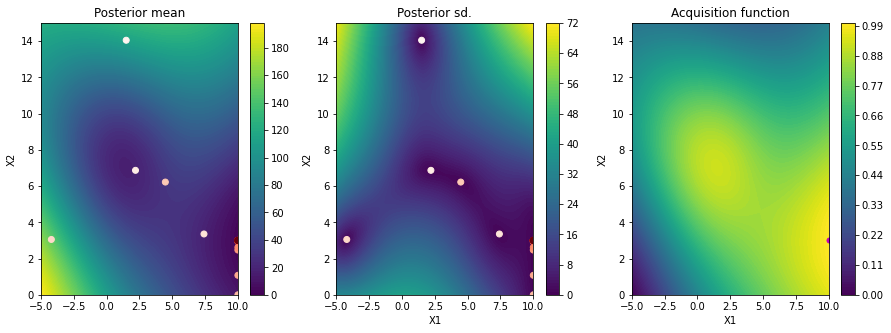

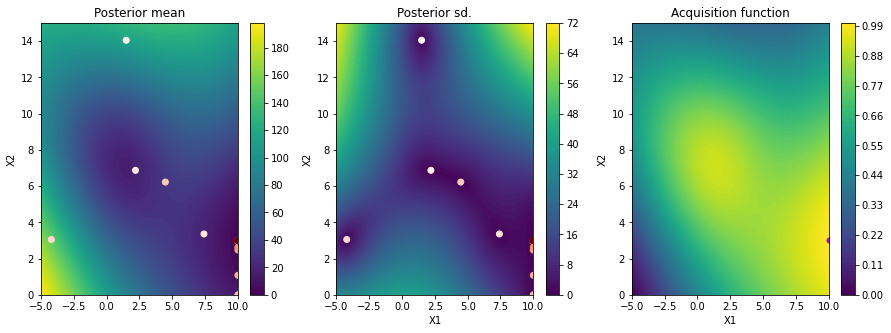

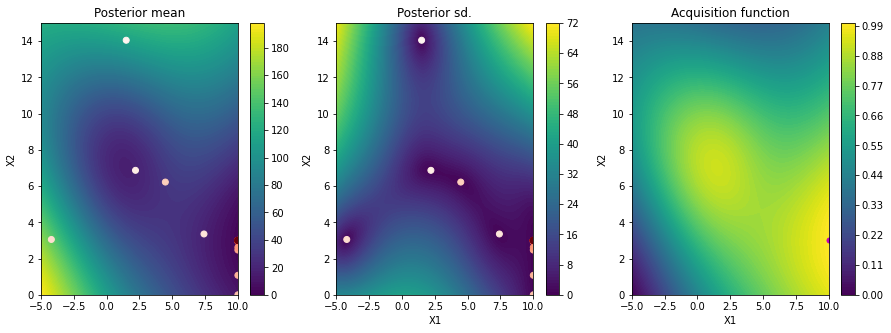

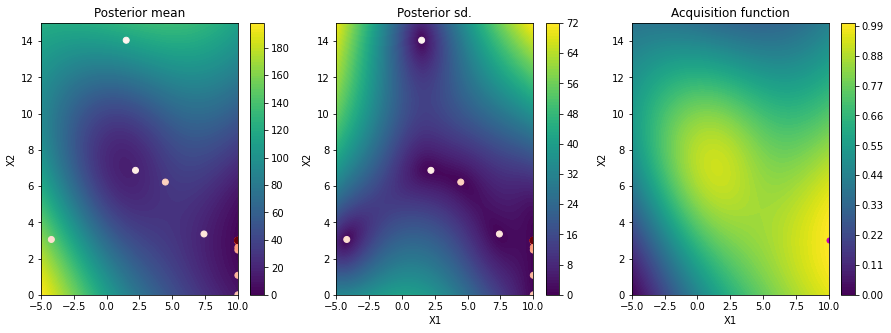

Minimal value found: 1.9431422634531952


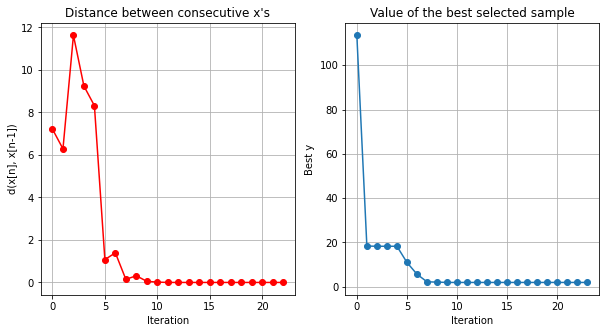

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (-5,10)}, {'name': 'var_2', 'type': 'continuous', 'domain': (0,15)}]

# Fonction objectif
c  = GPyOpt.objective_examples.experiments2d.branin().f

objective = GPyOpt.core.task.SingleObjective(func = c)
model = GPyOpt.models.GPModel(exact_feval=True,optimize_restarts=10,verbose=False)
feasible_region = GPyOpt.Design_space(space = bounds, constraints = [])
aquisition_optimizer = GPyOpt.optimization.AcquisitionOptimizer(feasible_region)
acquisition = GPyOpt.acquisitions.LCB.AcquisitionLCB(model, feasible_region, optimizer = aquisition_optimizer, exploration_weight = 0.002)
evaluator = GPyOpt.core.evaluators.Sequential(acquisition)
initial_design = GPyOpt.experiment_design.initial_design('random', feasible_region, 4)
bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,
                                                X_init = initial_design, Y_init = c(initial_design), normalize_Y = False)

for _ in range(20):
    bo.run_optimization(1)
    bo.plot_acquisition()
X, Y = bo.get_evaluations()

print("Minimal value found:", np.min(Y))
bo.plot_convergence()

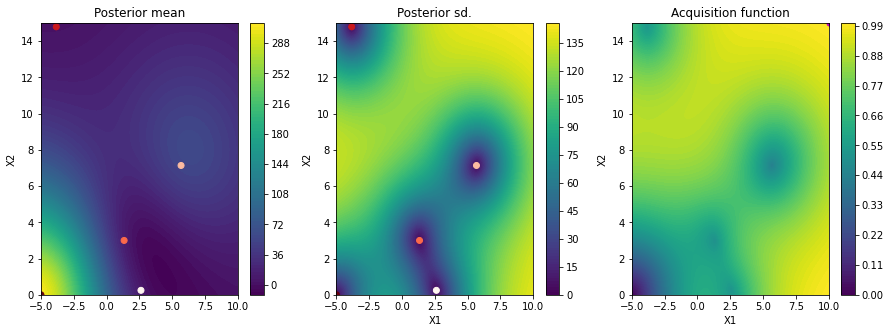

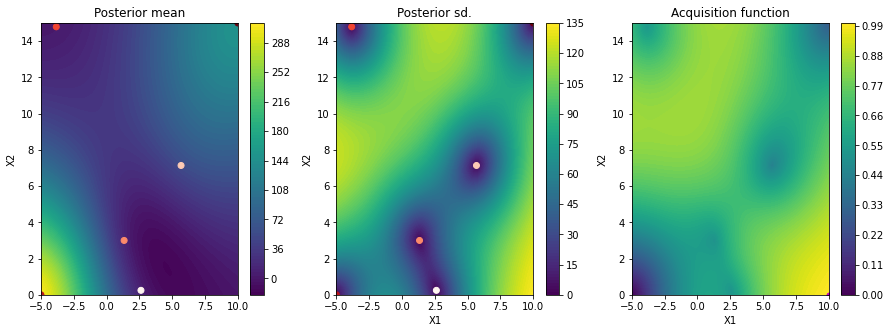

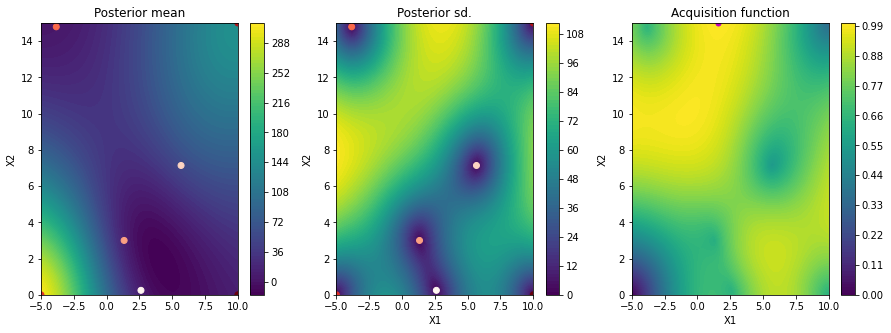

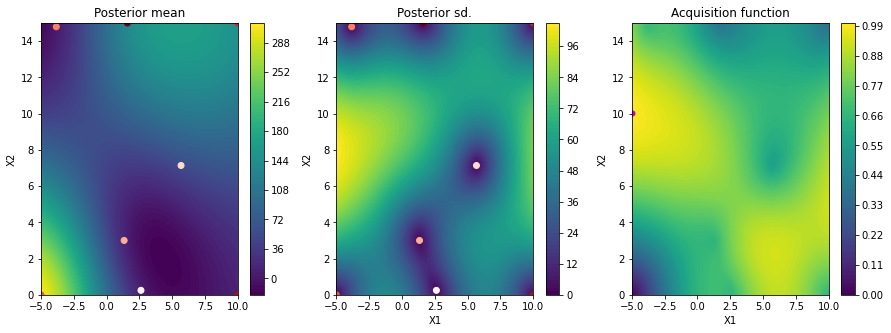

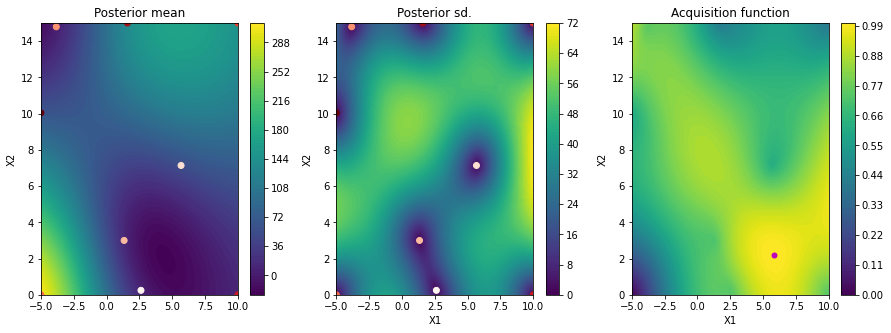

...

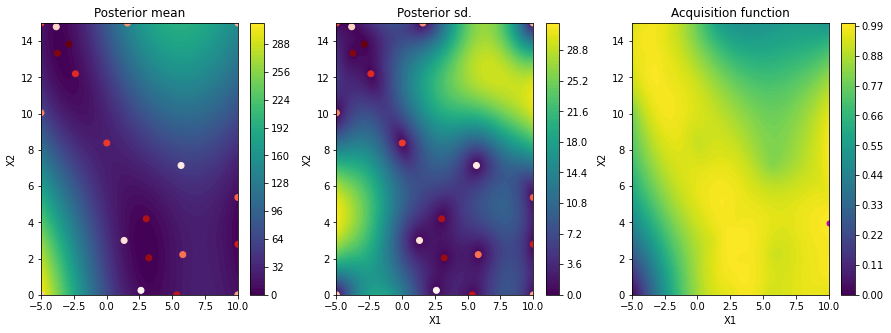

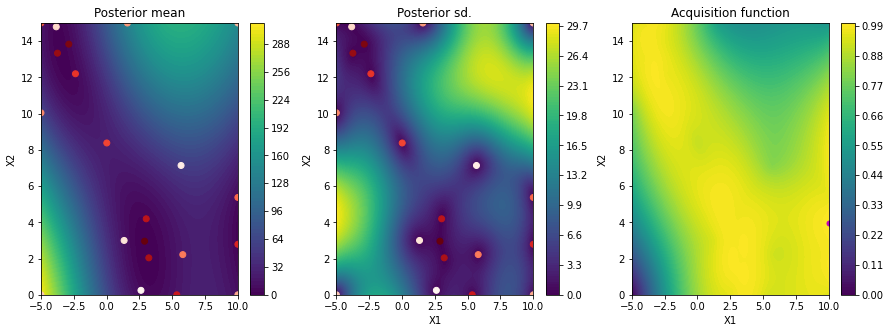

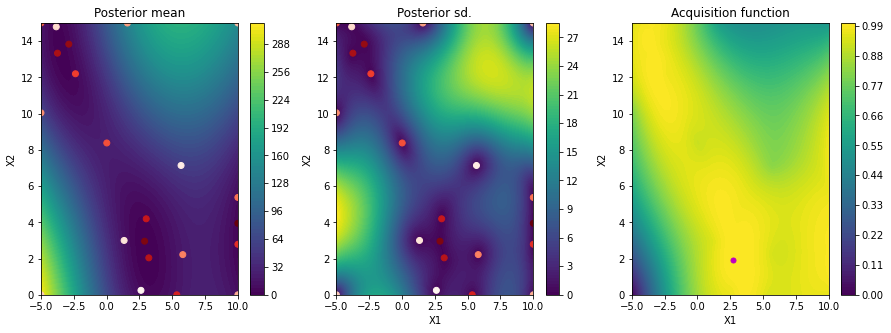

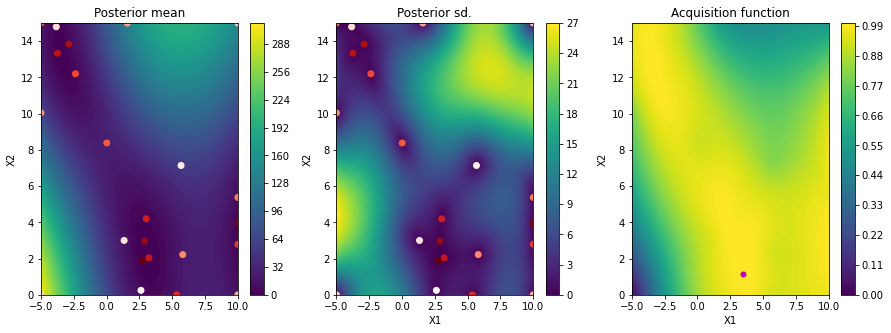

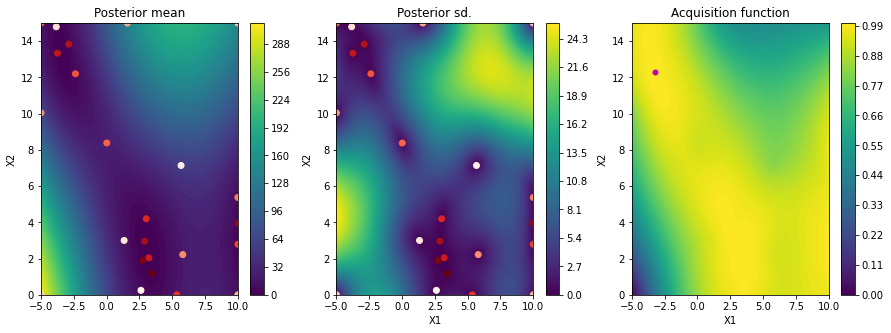

Minimal value found: 0.45559255152457645


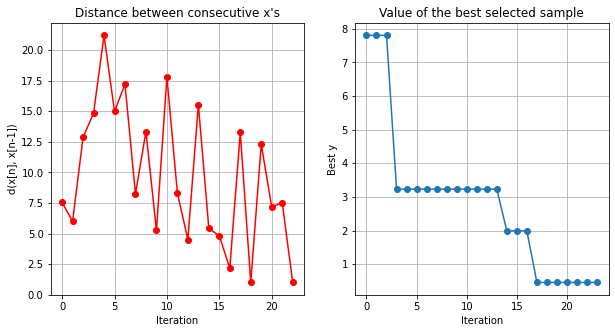

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (-5,10)}, {'name': 'var_2', 'type': 'continuous', 'domain': (0,15)}]

# Fonction objectif
c  = GPyOpt.objective_examples.experiments2d.branin().f



objective = GPyOpt.core.task.SingleObjective(func = c)
model = GPyOpt.models.GPModel(exact_feval=True,optimize_restarts=10,verbose=False)
feasible_region = GPyOpt.Design_space(space = bounds, constraints = [])
aquisition_optimizer = GPyOpt.optimization.AcquisitionOptimizer(feasible_region)
acquisition = GPyOpt.acquisitions.LCB.AcquisitionLCB(model, feasible_region, optimizer = aquisition_optimizer, exploration_weight = 2.)
evaluator = GPyOpt.core.evaluators.Sequential(acquisition)
initial_design = GPyOpt.experiment_design.initial_design('random', feasible_region, 4)
bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,
                                                X_init = initial_design, Y_init = c(initial_design), normalize_Y = False)

for _ in range(20):
    bo.run_optimization(1)
    bo.plot_acquisition()
X, Y = bo.get_evaluations()

print("Minimal value found:", np.min(Y))
bo.plot_convergence()

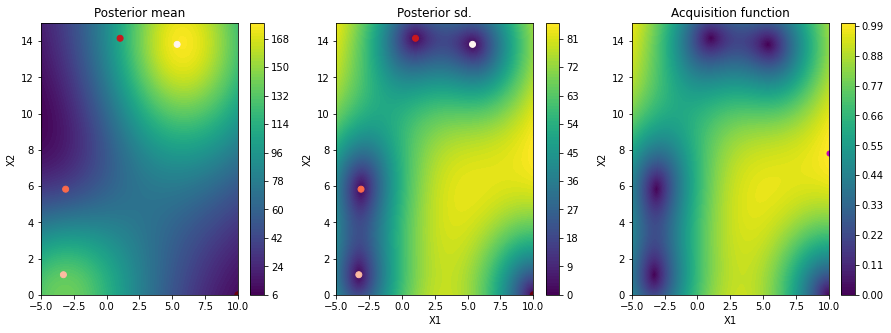

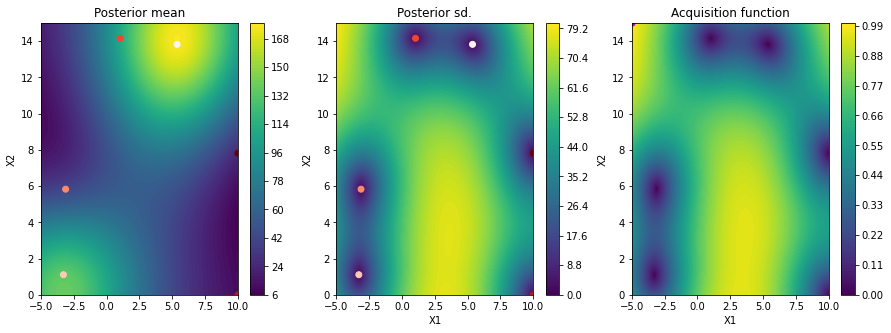

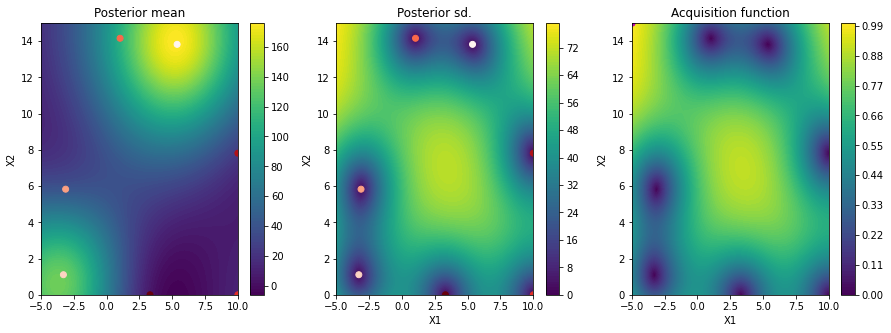

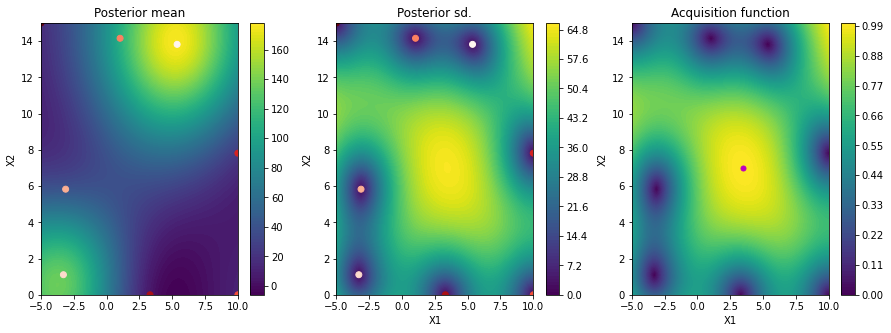

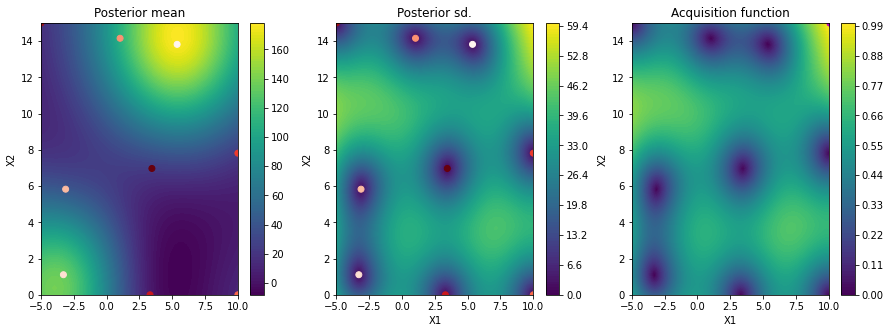

...

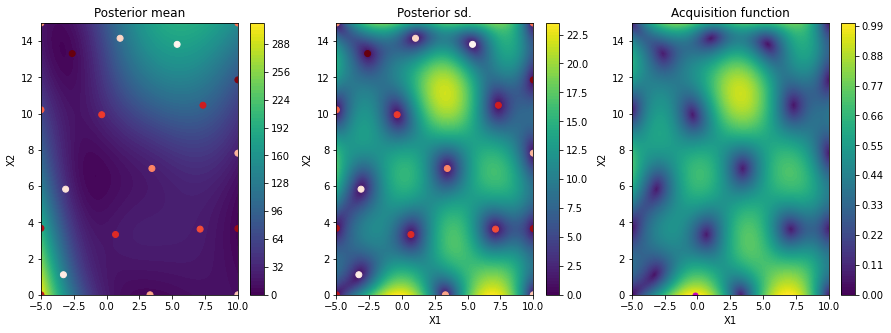

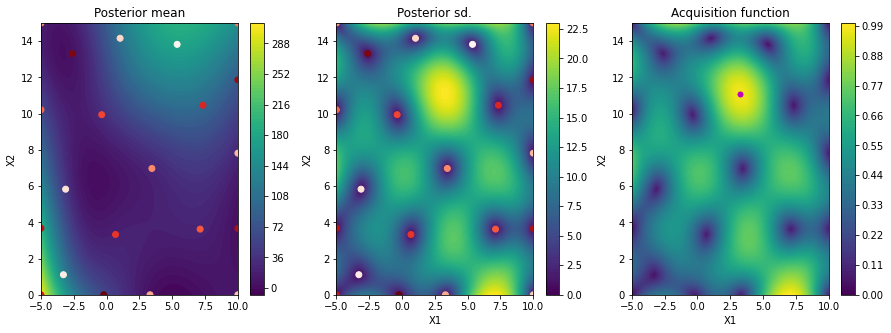

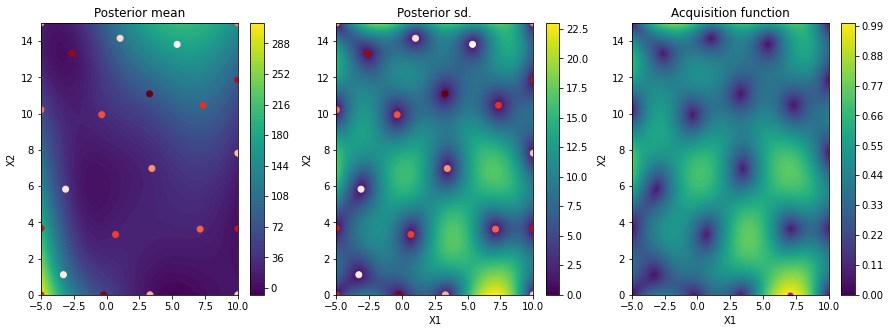

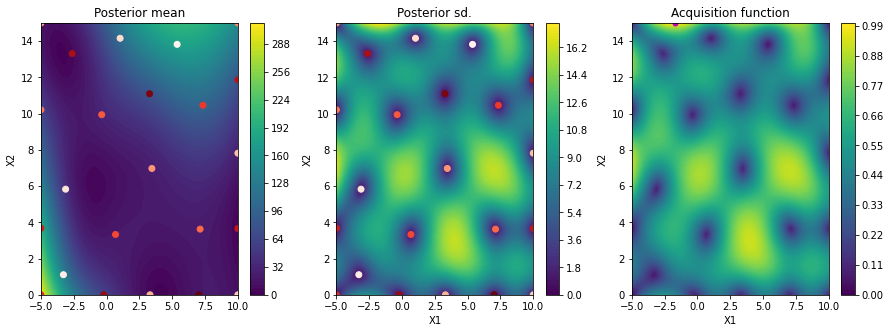

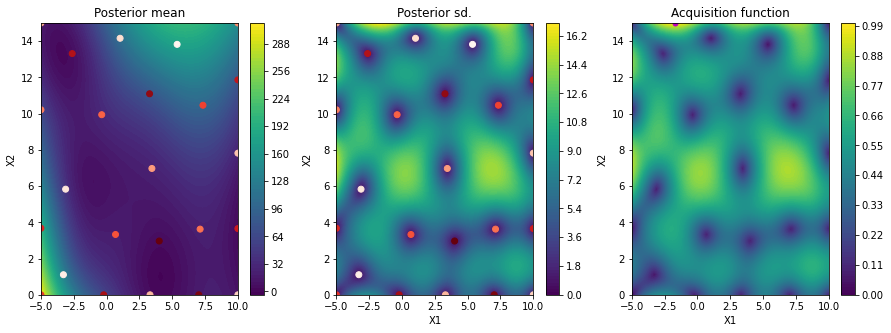

Minimal value found: 2.3687848306906893


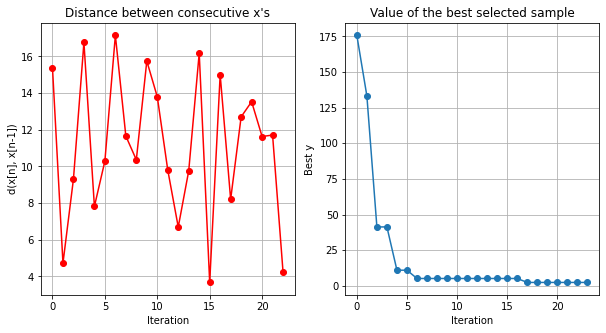

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (-5,10)}, {'name': 'var_2', 'type': 'continuous', 'domain': (0,15)}]

# Fonction objectif
c  = GPyOpt.objective_examples.experiments2d.branin().f

objective = GPyOpt.core.task.SingleObjective(func = c)
model = GPyOpt.models.GPModel(exact_feval=True,optimize_restarts=10,verbose=False)
feasible_region = GPyOpt.Design_space(space = bounds, constraints = [])
aquisition_optimizer = GPyOpt.optimization.AcquisitionOptimizer(feasible_region)
acquisition = GPyOpt.acquisitions.LCB.AcquisitionLCB(model, feasible_region, optimizer = aquisition_optimizer, exploration_weight = 200.)
evaluator = GPyOpt.core.evaluators.Sequential(acquisition)
initial_design = GPyOpt.experiment_design.initial_design('random', feasible_region, 4)
bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,
                                                X_init = initial_design, Y_init = c(initial_design), normalize_Y = False)

for _ in range(20):
    bo.run_optimization(1)
    bo.plot_acquisition()
X, Y = bo.get_evaluations()

print("Minimal value found:", np.min(Y))
bo.plot_convergence()

*Commenter ce que vous observez :*

# Contraintes

Dans GPyOpt, les contraintes sont obligatoirement des inégalités. Par exemple, pour une contrainte $x_3 + 2 * x_5 + 3 \le 0 $, on fournit à GPyOpt la contrainte formatée de la manière suivante : `x[:,2] + 2 * x[:,4] + 3` (la numérotation des listes commence à 0 dans Python, et on n'écrit que la partie de gauche de l'inégalité).

## En 1D : exercice

Exercice : optimiser $f $ entre 0 et 8 avec pour contrainte $ x > 3$, sur 10 itérations, avec 2 points initiaux.

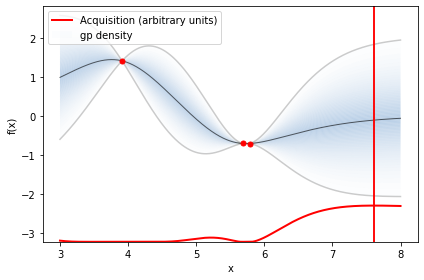

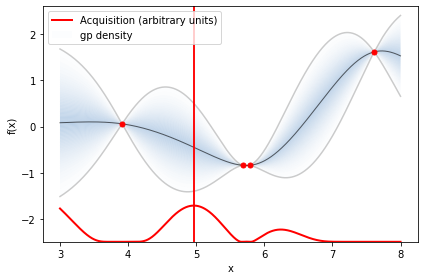

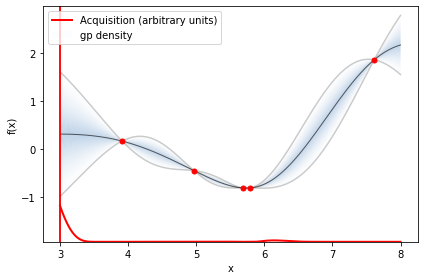

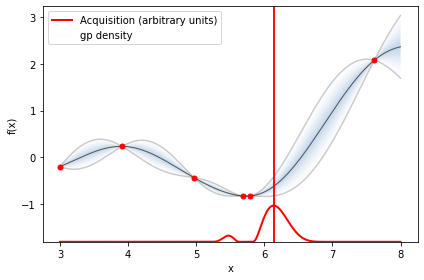

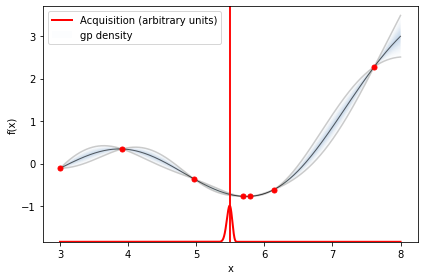

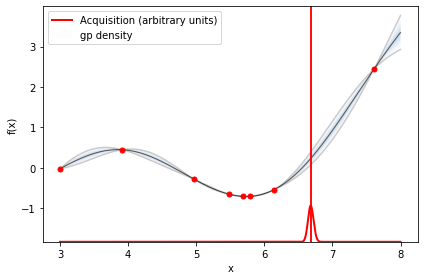

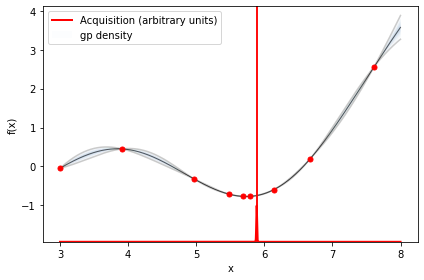

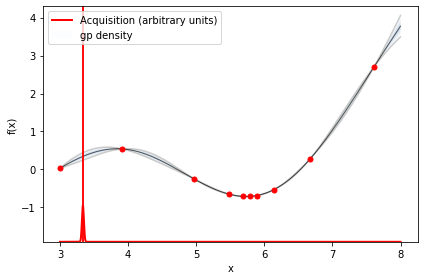

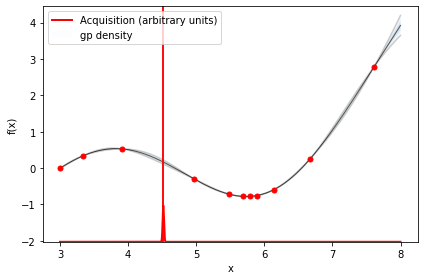

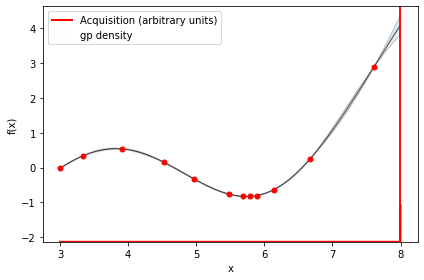

Minimal value found: -0.7502629267465407


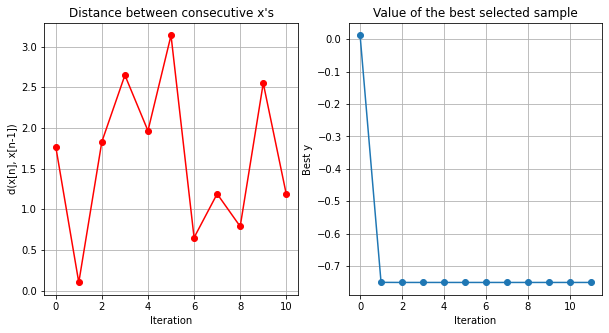

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
constraints = [{'name': 'constr_1', 'constraint': '- x[:,0] + 3'}]

bo = GPyOpt.methods.BayesianOptimization(f, bounds, acquisition_type='EI', constraints = constraints, initial_design_numdata = 2)

for _ in range(10):
    bo.run_optimization(1)
    bo.plot_acquisition()

X, Y = bo.get_evaluations()
print("Minimal value found:", np.min(Y))
bo.plot_convergence()

*Quel minimum trouvez-vous ?*

## En 2D : exercice

Optimiser la fonction objectif $c(\boldsymbol{x})$ sur 20 itérations, dans le domaine $x_1 \in [-5, 10]$ et $x_2 \in [0, 15]$, avec la contrainte suivante : $(x_1 - 2)^2 + (x_2 - 3)^2 < 30$.

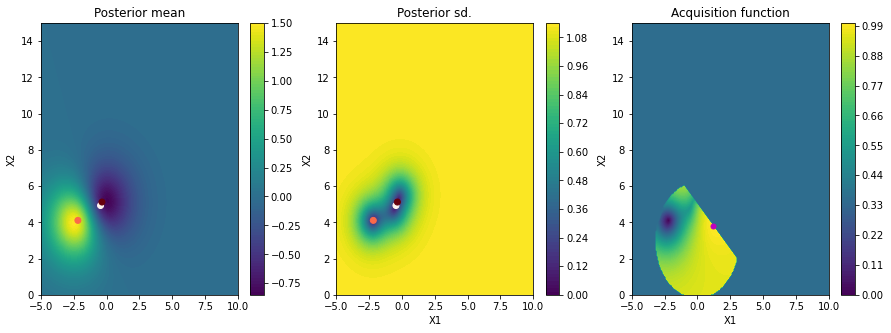

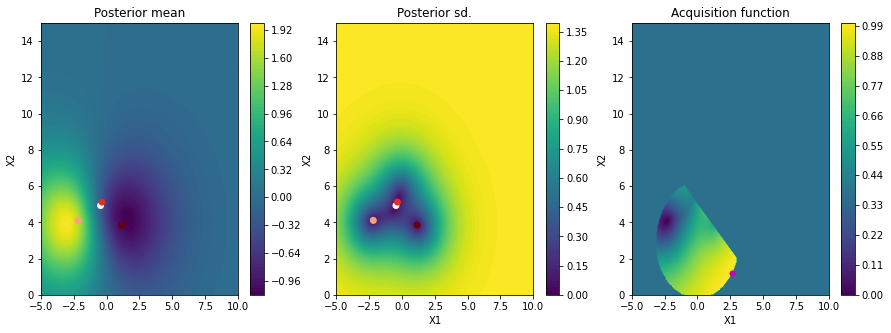

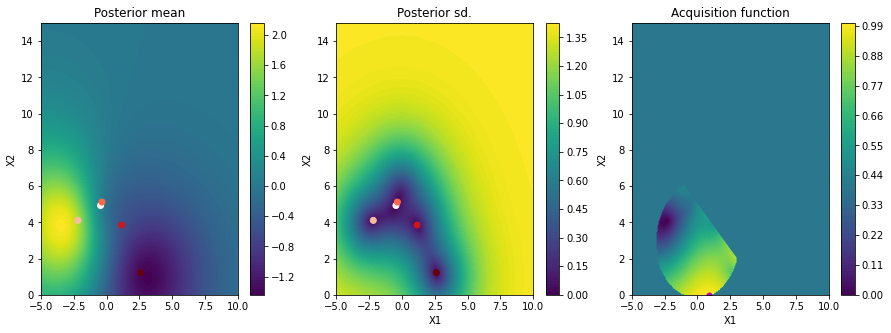

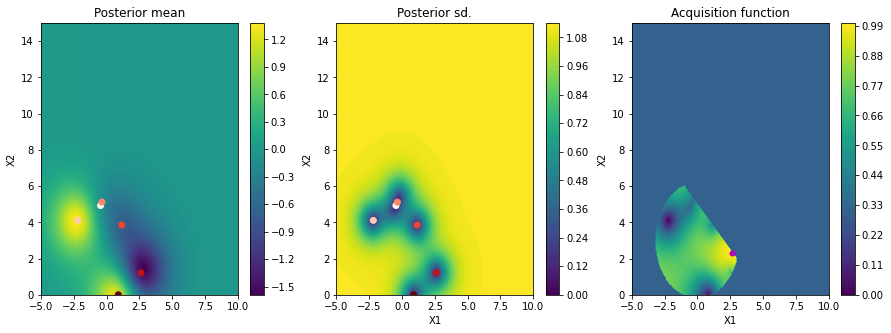

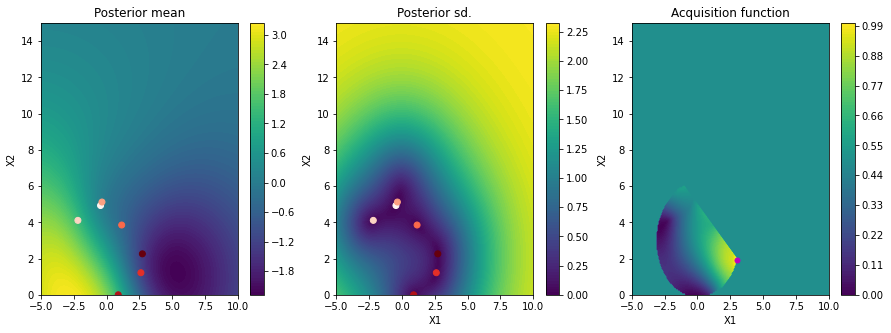

...

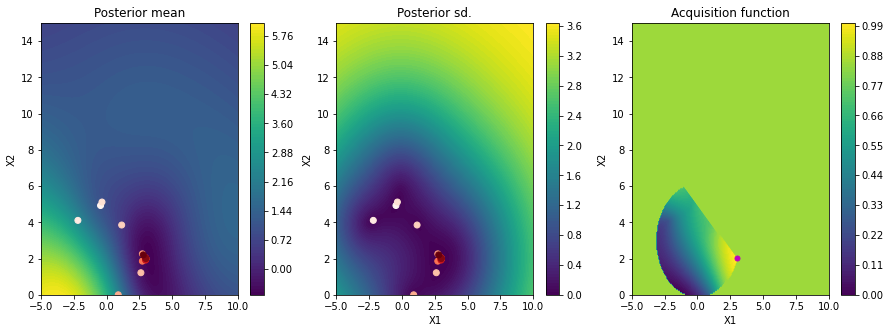

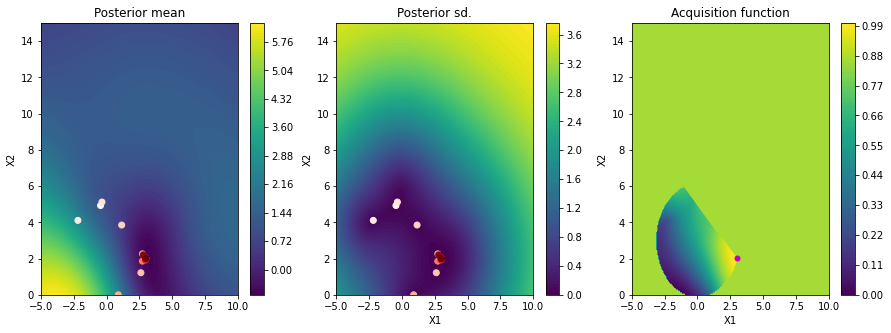

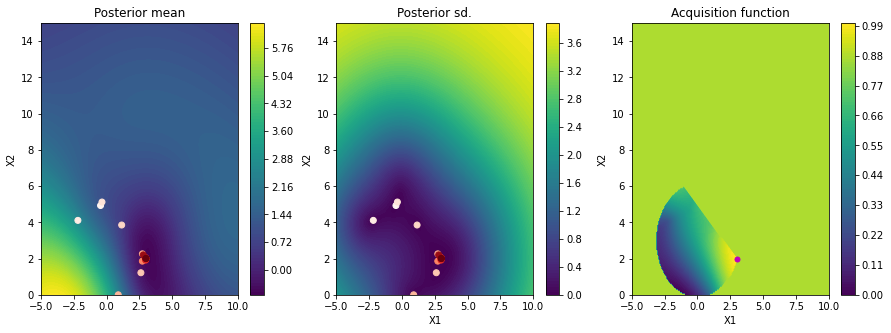

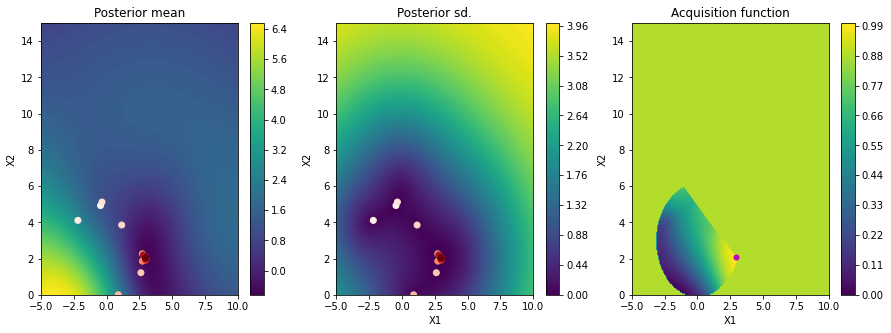

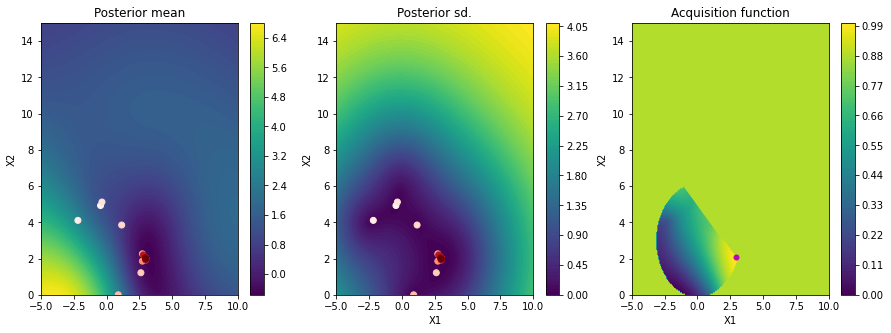

Minimal value found: 0.6456435153075191


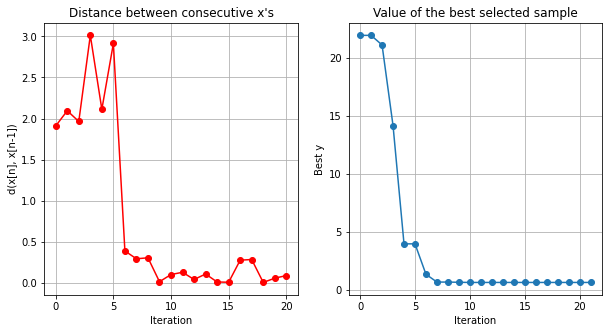

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (-5,10)}, {'name': 'var_2', 'type': 'continuous', 'domain': (0,15)}]
constraints = [{'name': 'constr_1', 'constraint': '(x[:,0])**2+(x[:,1]-3)**2  -10'},{'name': 'constr_2', 'constraint':"x[:,0]+x[:,1]-5"}]
bo = GPyOpt.methods.BayesianOptimization(c, bounds, acquisition_type='LCB', constraints = constraints, exploration_weight = 5., initial_design_numdata = 2)

for _ in range(20):
    bo.run_optimization(1)
    bo.plot_acquisition()
X, Y = bo.get_evaluations()

print("Minimal value found:", np.min(Y))
bo.plot_convergence()

*Quel minimum avez-vous obtenu ?*

*Quelle est la forme du domaine d'optimisation ?*

*Commentaires ?*

:*À quoi doit-on prendre garde lorsqu'on définit des contraintes ?*

Il faut attention à ce que l'on puisse satisfaire cette/ces contrainte/s

# Optimisation de fonctions objectif bruitées : exercice

0.17699293495402374 0.10104331019634835


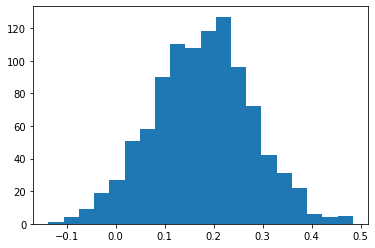

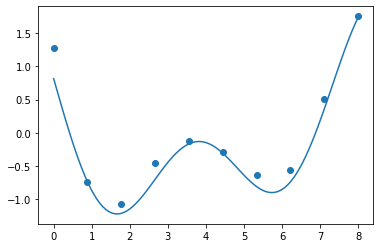

In [ ]:
# Rappel :
# def f(x):
#    return np.multiply((0.5*x - 2.), np.sin(x - 0.5))

# Définir la fonction f_noisy égale à f + un bruit gaussien de variance 0.1
# Indice : utiliser la fonction np.random.normal
def f_noisy(x):
    return f(x) + np.random.normal(0, 0.1)

# Écrire une boucle évaluant f_noisy(0.4) mille fois, puis calculer la moyenne des cent valeurs obtenues et leur écart-type.
# Indice : utiliser les fonctions np.mean et np.std
results = []
for i in range(1000):
    results.append(f_noisy(0.4))
print(np.mean(results), np.std(results))

_ = plt.hist(results, bins = 20)
plt.show()

X = np.linspace(0, 8, 10)
# Évaluer la fonction f_noisy en chacun des x appartenant à X
Y_noisy = [f_noisy(x) for x in X]
# Ici, on trace les points évalués à partir de f_noisy et f(x) sur un même graphe
X_non_noisy = np.linspace(0, 8, 100)
plt.plot(X_non_noisy, f_noisy(X_non_noisy))
plt.plot(X, Y_noisy, marker = 'o', color = 'C0', linestyle="None")

Exercice : optimiser la fonction objectif $ f_{noisy}$ sur 20 itérations.

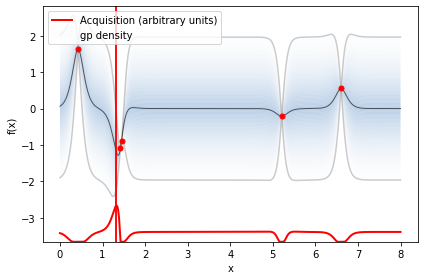

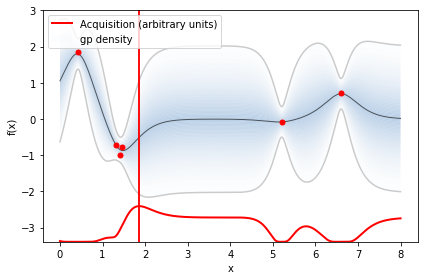

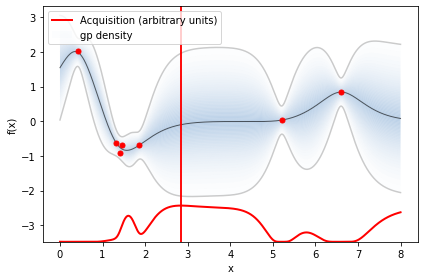

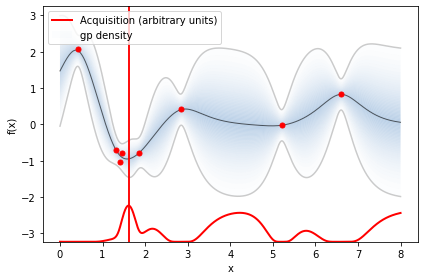

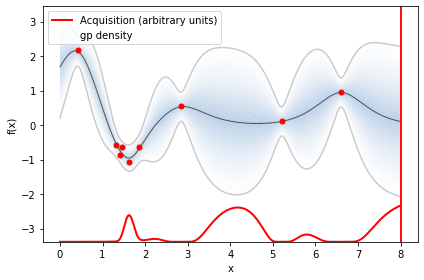

...

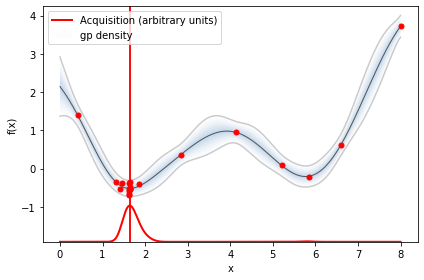

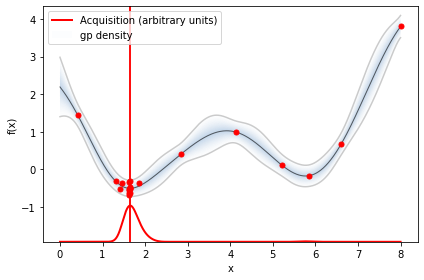

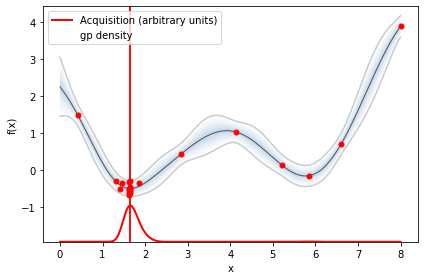

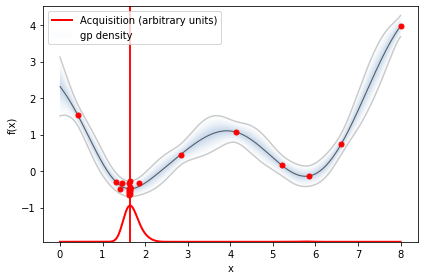

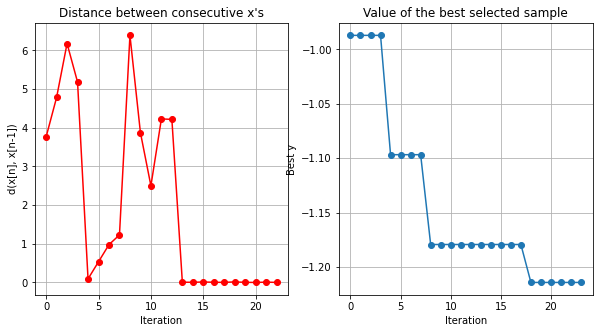

In [ ]:
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
bo = GPyOpt.methods.BayesianOptimization(f_noisy, bounds, acquisition_type='EI', initial_design_numdata = 4)

for _ in range(20):
    bo.run_optimization(1)
    bo.plot_acquisition()

bo.plot_convergence()

*Commentaires ?*

# Optimisation séquentielle

Dans la plupart des exemples, on fournissait la fonction objectif à GPyOpt. Il y a une autre manière de faire si on ne la connaît pas.

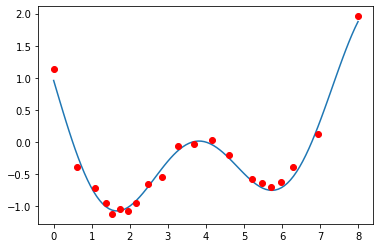

In [ ]:

# Si on ne connaît pas la fonction d'acquisition, on donne 'None' comme paramètre
objective = GPyOpt.core.task.SingleObjective(func = None) #func=None : on ne connait pas la f° obj
model = GPyOpt.models.GPModel(exact_feval=True,optimize_restarts=10,verbose=False) #class GPModel, processus gaussien, exact_feval=True on ne prend pas en compte le bruit
bounds = [{'name': 'var_1', 'type': 'continuous', 'domain': (0,8)}]
feasible_region = GPyOpt.Design_space(space = bounds, constraints = []) # On définit la région disponible (les valeurs de x et les contraintes)
aquisition_optimizer = GPyOpt.optimization.AcquisitionOptimizer(feasible_region)
acquisition = GPyOpt.acquisitions.LCB.AcquisitionLCB(model, feasible_region, optimizer = aquisition_optimizer, exploration_weight = 5) #Choix de la fonction d'acquisition
evaluator = GPyOpt.core.evaluators.Sequential(acquisition)
initial_design = GPyOpt.experiment_design.initial_design('random', feasible_region, 1) # Choix des points de départ, ici on choisit 4 points aléatoires dans la région, le choix de nombre est important seulement si on ne choisit pas un bon alpha
X = initial_design
Y=f_noisy(X)
bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,X_init = X, Y_init = Y, normalize_Y = False)# Dnas X_init et Y_init on met toutes les données dont on dispose (liste vide si aucune donnée),X array, Y vecteur colonne
# Ici on récupère la prochaine expérience à réaliser
x_new = bo.suggest_next_locations() #

# Ensuite on réalise l'expérience (-> on obtient un 'y_new')
y_new = f_noisy(x_new)
for _ in range(20):
  # Puis on intègre x_new et y_new aux données (X et Y)
  X,Y = np.vstack((X,x_new)),np.vstack((Y,y_new))
  # Puis on appelle de nouveau suggest_next_locations pour obtenir la prochaine expérience à réaliser
  bo = GPyOpt.methods.ModularBayesianOptimization(model, feasible_region, objective, acquisition, evaluator,X_init = X, Y_init = Y, normalize_Y = False,model_update_interval=1)
  x_new = bo.suggest_next_locations()
  y_new = f_noisy(x_new)


plt.plot(np.linspace(0,8,100),f(np.linspace(0,8,100)))
plt.plot(X,Y,'ro')
plt.show()

Vous utiliserez cette méthode pour résoudre l'exercice qui vous sera fourni (partie 3).

# Limites des bibliothèques open-source d'optimisation Bayésienne

Les bibliothèques open-source actuelles d'optimisation Bayésienne ont plusieurs limites :
- Gestion des paramètres catégoriels très mauvaise (-> l'optimiseur ne trouve pas toujours l'optimum)
- Gestion des contraintes limitées (ne supportent que les inégalités en général + ne supportent pas les contraintes conditionnelles)
- Temps de calcul *parfois* longs

Autre packages d'optimisation:
BOtorch